In [1]:
!python --version

Python 3.10.9


In [65]:
!pip list

Package                      Version
---------------------------- -----------
aiofiles                     24.1.0
altair                       5.5.0
annotated-types              0.7.0
anyio                        4.9.0
argon2-cffi                  21.3.0
argon2-cffi-bindings         21.2.0
asttokens                    2.0.5
attrs                        22.1.0
Babel                        2.11.0
backcall                     0.2.0
beautifulsoup4               4.11.1
bleach                       4.1.0
blinker                      1.9.0
brotlipy                     0.7.0
cachetools                   5.5.2
certifi                      2022.12.7
cffi                         1.15.1
charset-normalizer           2.0.4
click                        8.1.8
colorama                     0.4.6
comm                         0.1.2
contourpy                    1.0.7
cryptography                 39.0.1
cycler                       0.11.0
debugpy                      1.5.1
decorator                    5.1.1

In [66]:
!pip freeze > req.text

In [ ]:
# laod modules
import os
from collections import defaultdict
from PIL import Image
import os
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
from torch.utils.data import Dataset




# load dataset

In [ ]:

import os
from collections import defaultdict
from PIL import Image

data_dir = "Indian Food Images" 

class_counts = defaultdict(int)

# Loop through each class folder
for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    
    if os.path.isdir(class_path):  # Check if it's a folder (a class)
        for filename in os.listdir(class_path):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(class_path, filename)
                
                # Load image (no transformations)
                image = Image.open(image_path)
                
                # Update count
                class_counts[class_name] += 1

# Print image count per class
print("Image count per class:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")



Image count per class:
adhirasam: 50 images
aloo_gobi: 50 images
aloo_matar: 50 images
aloo_methi: 50 images
aloo_shimla_mirch: 50 images
aloo_tikki: 50 images
anarsa: 50 images
ariselu: 50 images
bandar_laddu: 50 images
basundi: 50 images
bhatura: 50 images
bhindi_masala: 50 images
biryani: 50 images
boondi: 50 images
butter_chicken: 50 images
chak_hao_kheer: 50 images
cham_cham: 50 images
chana_masala: 50 images
chapati: 50 images
chhena_kheeri: 50 images
chicken_razala: 50 images
chicken_tikka: 50 images
chicken_tikka_masala: 50 images
chikki: 50 images
daal_baati_churma: 50 images
daal_puri: 50 images
dal_makhani: 50 images
dal_tadka: 50 images
dharwad_pedha: 50 images
doodhpak: 50 images
double_ka_meetha: 50 images
dum_aloo: 50 images
gajar_ka_halwa: 50 images
gavvalu: 50 images
ghevar: 50 images
gulab_jamun: 50 images
imarti: 50 images
jalebi: 50 images
kachori: 50 images
kadai_paneer: 50 images
kadhi_pakoda: 50 images
kajjikaya: 50 images
kakinada_khaja: 50 images
kalakand: 50 i

In [13]:
total_images = sum(class_counts.values())
print(f"\nTotal number of images: {total_images}")




Total number of images: 4000


In [14]:
num_classes = len(class_counts)
print(f"\nTotal number of classes: {num_classes}")



Total number of classes: 80


# Display images

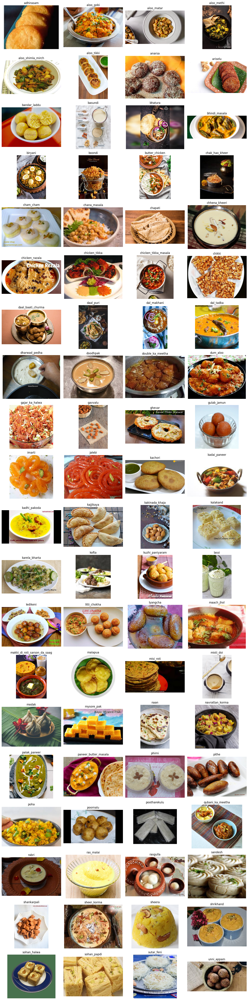

In [19]:
import os
from PIL import Image
import matplotlib.pyplot as plt

data_dir = 'Indian Food Images'  # Path to your dataset

# Collect one image per class
class_images = []
class_labels = []

for class_name in sorted(os.listdir(data_dir)):
    class_path = os.path.join(data_dir, class_name)
    
    if os.path.isdir(class_path):
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        if image_files:
            image_path = os.path.join(class_path, image_files[0])
            image = Image.open(image_path)
            class_images.append(image)
            class_labels.append(class_name)

# Define grid size
num_classes = len(class_images)
cols = 4
rows = (num_classes + cols - 1) // cols  # ceil division

# Plot images in grid
plt.figure(figsize=(15, rows * 3))
for i, (img, label) in enumerate(zip(class_images, class_labels)):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(label)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [67]:
# collect image and lables

In [1]:
import os
from sklearn.model_selection import train_test_split

data_dir = 'Indian Food Images'
image_paths = []
labels = []

# Map class names to integer labels
class_to_idx = {class_name: idx for idx, class_name in enumerate(sorted(os.listdir(data_dir)))}

# Collect image paths and corresponding labels
for class_name in sorted(os.listdir(data_dir)):
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        for file in os.listdir(class_path):
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(class_path, file))
                labels.append(class_to_idx[class_name])

print(f"Total images: {len(image_paths)}")
print(f"Total labels: {len(labels)}")
print(f"Total classes: {len(class_to_idx)}")


Total images: 4000
Total labels: 4000
Total classes: 80


# apply transformation

In [2]:
import torchvision.transforms as transforms

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


In [13]:
class FoodDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        try:
            image = Image.open(self.image_paths[idx]).convert('RGB')
            label = self.labels[idx]
            if self.transform:
                image = self.transform(image)
            return image, label
        except Exception as e:
            print(f"Failed to load image: {self.image_paths[idx]} – {e}")
            return self.__getitem__((idx + 1) % len(self.image_paths))


In [4]:
from sklearn.model_selection import train_test_split

train_paths, val_paths, train_labels, val_labels = train_test_split(
    image_paths, labels, test_size=0.2, stratify=labels, random_state=42)


In [14]:
from torch.utils.data import DataLoader

train_dataset = FoodDataset(train_paths, train_labels, transform=train_transform)
val_dataset = FoodDataset(val_paths, val_labels, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=0)



In [15]:
num_classes = len(class_to_idx)
print("Number of classes:", num_classes)


Number of classes: 80


In [10]:
print(len(train_loader))  # Should be > 0


100


# Mobile Net model

In [18]:
import torch
import torch.nn as nn
from torchvision import models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.mobilenet_v2(pretrained=True)
num_classes = len(class_to_idx)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model = model.to(device)

c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [19]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)



In [24]:
num_epochs = 15
train_losses, val_losses, val_accuracies = [], [], []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0
    print(f"Epoch {epoch+1}/{num_epochs} Training Started...")
    
    for i, (images, labels) in enumerate(train_loader):
        # Print statement to check if data is coming from the train_loader
        if i % 10== 0:  # Print every 100 batches
            print(f"Batch {i}/{len(train_loader)} - Loading {images.size(0)} images")

        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    print(f"Epoch {epoch+1}/{num_epochs} | Avg Train Loss: {avg_train_loss:.4f}")
    
    # Validation
    model.eval()
    val_loss = 0
    correct, total = 0, 0
    print(f"Epoch {epoch+1}/{num_epochs} Validation Started...")
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(val_loader)
    accuracy = correct / total
    val_losses.append(avg_val_loss)
    val_accuracies.append(accuracy)
    print(f"Epoch {epoch+1}/{num_epochs} | Val Loss: {avg_val_loss:.4f} | Val Accuracy: {accuracy:.4f}")

# ---------------------------
# 10. Save model
# ---------------------------
torch.save(model.state_dict(), "mobilenet_indian_food.pth")
print("Model saved.")


Epoch 1/15 Training Started...
Batch 0/100 - Loading 32 images
Batch 10/100 - Loading 32 images
Batch 20/100 - Loading 32 images
Batch 30/100 - Loading 32 images
Batch 40/100 - Loading 32 images
Batch 50/100 - Loading 32 images
Batch 60/100 - Loading 32 images
Batch 70/100 - Loading 32 images
Batch 80/100 - Loading 32 images
Batch 90/100 - Loading 32 images
Epoch 1/15 | Avg Train Loss: 1.8200
Epoch 1/15 Validation Started...
Epoch 1/15 | Val Loss: 2.2483 | Val Accuracy: 0.3912
Epoch 2/15 Training Started...
Batch 0/100 - Loading 32 images
Batch 10/100 - Loading 32 images
Batch 20/100 - Loading 32 images
Batch 30/100 - Loading 32 images
Batch 40/100 - Loading 32 images
Batch 50/100 - Loading 32 images
Batch 60/100 - Loading 32 images
Batch 70/100 - Loading 32 images
Batch 80/100 - Loading 32 images
Batch 90/100 - Loading 32 images
Epoch 2/15 | Avg Train Loss: 1.5422
Epoch 2/15 Validation Started...
Epoch 2/15 | Val Loss: 2.1926 | Val Accuracy: 0.4350
Epoch 3/15 Training Started...
Batch

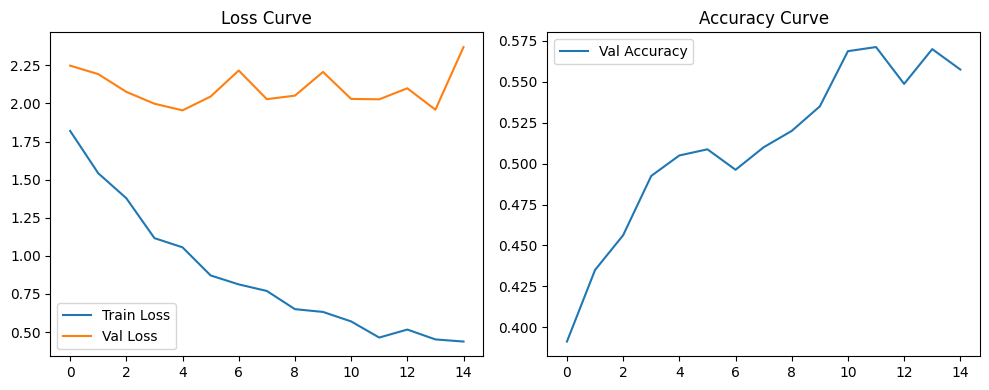

In [31]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

model.load_state_dict(torch.load("mobilenet_indian_food.pth", map_location=device))
model.eval()

# ---------------------------
# 12. Plot loss and accuracy
# ---------------------------
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.title("Loss Curve")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(val_accuracies, label='Val Accuracy')
plt.title("Accuracy Curve")
plt.legend()
plt.tight_layout()
plt.show()


In [28]:

# ---------------------------
# 13. Confusion Matrix + Report
# ---------------------------
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels)


print("\nClassification Report:")
print(classification_report(all_labels, all_preds, target_names=list(class_to_idx.keys())))


Classification Report:
                              precision    recall  f1-score   support

                   adhirasam       0.62      0.80      0.70        10
                   aloo_gobi       0.71      0.50      0.59        10
                  aloo_matar       0.33      0.50      0.40        10
                  aloo_methi       1.00      0.20      0.33        10
           aloo_shimla_mirch       1.00      0.30      0.46        10
                  aloo_tikki       0.73      0.80      0.76        10
                      anarsa       0.50      0.50      0.50        10
                     ariselu       0.50      0.30      0.37        10
                bandar_laddu       0.33      0.10      0.15        10
                     basundi       0.44      0.40      0.42        10
                     bhatura       1.00      0.80      0.89        10
               bhindi_masala       0.67      0.60      0.63        10
                     biryani       0.62      0.50      0.56      

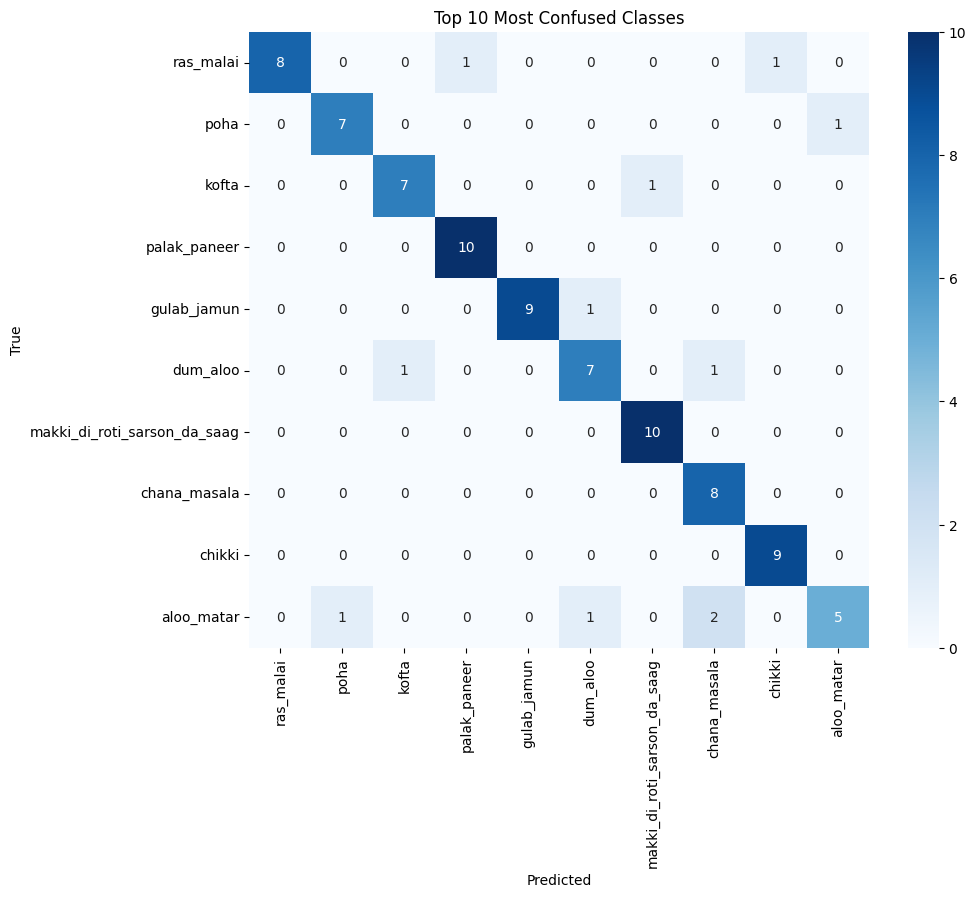

In [27]:
import numpy as np

# Get most confused pairs
cm_sum = cm.sum(axis=1) + cm.sum(axis=0)
most_confused = np.argsort(-cm_sum)[:10]  # Top 10 confused classes

# Subset the matrix
cm_subset = cm[np.ix_(most_confused, most_confused)]
labels_subset = [list(class_to_idx.keys())[i] for i in most_confused]

plt.figure(figsize=(10, 8))
sns.heatmap(cm_subset, annot=True, fmt='d', xticklabels=labels_subset, yticklabels=labels_subset, cmap="Blues")
plt.title("Top 10 Most Confused Classes")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


In [34]:
import pandas as pd
report = classification_report(all_labels, all_preds, target_names=list(class_to_idx.keys()), output_dict=True)
df_report = pd.DataFrame(report).transpose()
df_report.to_csv("classification_report.csv")


# Hybrid model (mobile net+random forest)

In [35]:
import torch
import torch.nn as nn
from torchvision import models

# Load your trained model
mobilenet = models.mobilenet_v2(pretrained=False)
mobilenet.classifier[1] = nn.Linear(mobilenet.last_channel, num_classes)
mobilenet.load_state_dict(torch.load("mobilenet_indian_food.pth"))
mobilenet.eval()
mobilenet.to(device)


c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [36]:
# Remove the classification head
feature_extractor = nn.Sequential(*list(mobilenet.children())[:-1])
feature_extractor.eval()


Sequential(
  (0): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=1e-05, m

# extract feature by mobile net


In [37]:
def extract_features(images):
    with torch.no_grad():
        # Extract features before the classifier layer
        features = mobilenet.features(images)  # Shape: [batch, 1280, 7, 7]
        features = features.mean([2, 3])       # Global average pooling -> [batch, 1280]
        return features.cpu().numpy()


In [ ]:
train_features, train_labels = [], []
val_features, val_labels = [], []

for images, labels in train_loader:
    images = images.to(device)
    feats = extract_features(images)
    train_features.extend(feats)
    train_labels.extend(labels.numpy())

for images, labels in val_loader:
    images = images.to(device)
    feats = extract_features(images)
    val_features.extend(feats)
    val_labels.extend(labels.numpy())


In [40]:
len(train_labels)

3200

In [41]:
len(val_labels)

800

In [42]:
val_features

[array([0.43028626, 0.2208377 , 0.        , ..., 0.01316761, 0.07418417,
        0.759851  ], dtype=float32),
 array([3.4513223 , 0.        , 0.        , ..., 0.21725047, 0.75464785,
        0.51472604], dtype=float32),
 array([6.5707999e-01, 1.2759969e+00, 1.6126324e-03, ..., 8.3354592e-01,
        9.3406862e-01, 1.7372025e+00], dtype=float32),
 array([0.84041107, 0.6515874 , 0.53244627, ..., 0.3676089 , 0.37584764,
        0.36643615], dtype=float32),
 array([0.49965256, 0.23532106, 2.1137938 , ..., 0.        , 2.3415082 ,
        0.        ], dtype=float32),
 array([0.86995107, 0.8015027 , 0.0217361 , ..., 1.6981348 , 0.35821402,
        0.        ], dtype=float32),
 array([0.32689577, 0.21828815, 0.00757452, ..., 0.02724315, 1.5109079 ,
        0.01166174], dtype=float32),
 array([0.0456347 , 1.076829  , 0.04520519, ..., 0.28161362, 1.0619826 ,
        0.98353785], dtype=float32),
 array([1.5605905 , 0.04081332, 0.44667685, ..., 0.32794657, 0.2185038 ,
        0.08679271], dtype=fl

In [44]:
from sklearn.model_selection import train_test_split

# 1. Combine features and labels
all_features = train_features + val_features
all_labels = train_labels + val_labels

# 2. Convert to numpy arrays if not already
all_features = np.array(all_features)
all_labels = np.array(all_labels)

# 3. Split into new train/test sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(
    all_features, all_labels, test_size=0.3, random_state=42, stratify=all_labels
)

print(f"New Train size: {len(X_train)}")
print(f"New Test size: {len(X_test)}")


New Train size: 2800
New Test size: 1200


# Rf model

In [45]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# 4. Train Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# 5. Evaluate
y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy on Test Set: {accuracy:.4f}")



Random Forest Accuracy on Test Set: 0.8450


In [48]:
rf_model.score(X_train,y_train)

1.0

In [46]:
# 7. Classification Report
# Make sure you have class labels
# If class_to_idx is a dict like {"Biriyani": 0, "Dosa": 1, ...}
# Then reverse it to get index to class:
idx_to_class = {v: k for k, v in class_to_idx.items()}
class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=class_names))


Classification Report:
                              precision    recall  f1-score   support

                   adhirasam       0.87      0.87      0.87        15
                   aloo_gobi       0.57      0.87      0.68        15
                  aloo_matar       0.76      0.87      0.81        15
                  aloo_methi       1.00      0.87      0.93        15
           aloo_shimla_mirch       1.00      0.67      0.80        15
                  aloo_tikki       0.87      0.87      0.87        15
                      anarsa       0.87      0.87      0.87        15
                     ariselu       0.73      0.73      0.73        15
                bandar_laddu       0.92      0.80      0.86        15
                     basundi       0.67      0.80      0.73        15
                     bhatura       0.88      1.00      0.94        15
               bhindi_masala       0.93      0.87      0.90        15
                     biryani       0.93      0.93      0.93       

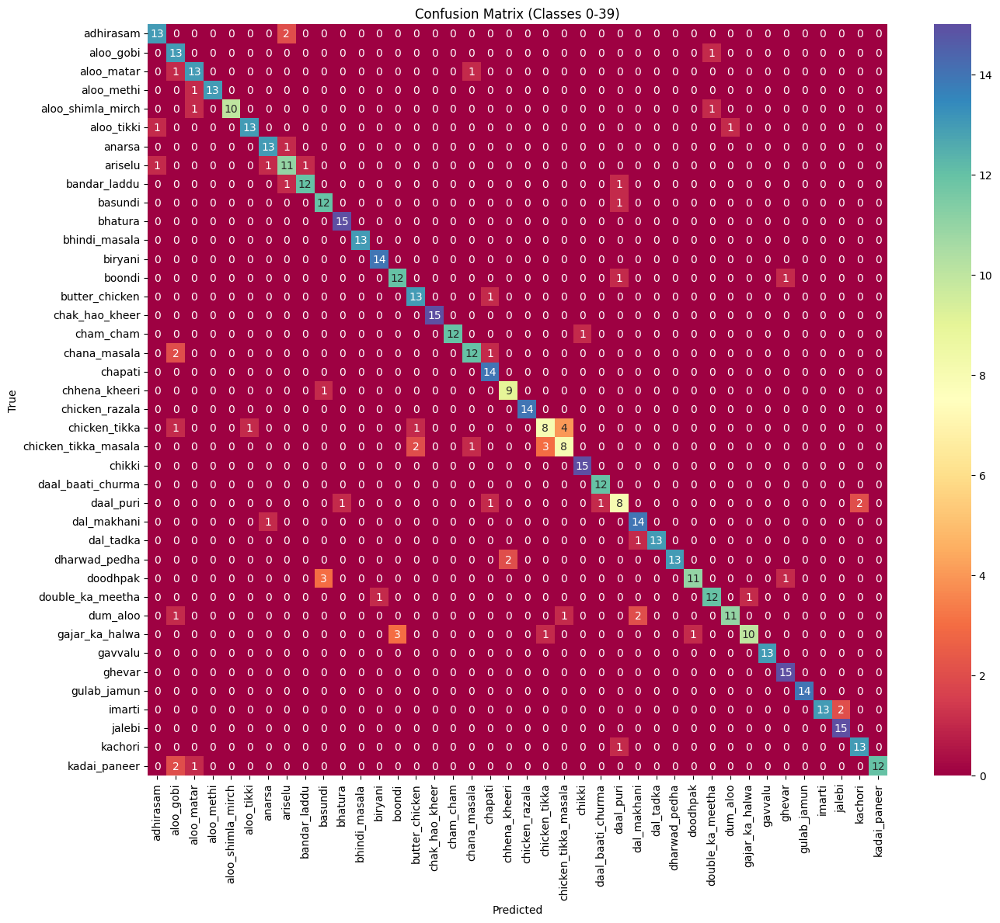

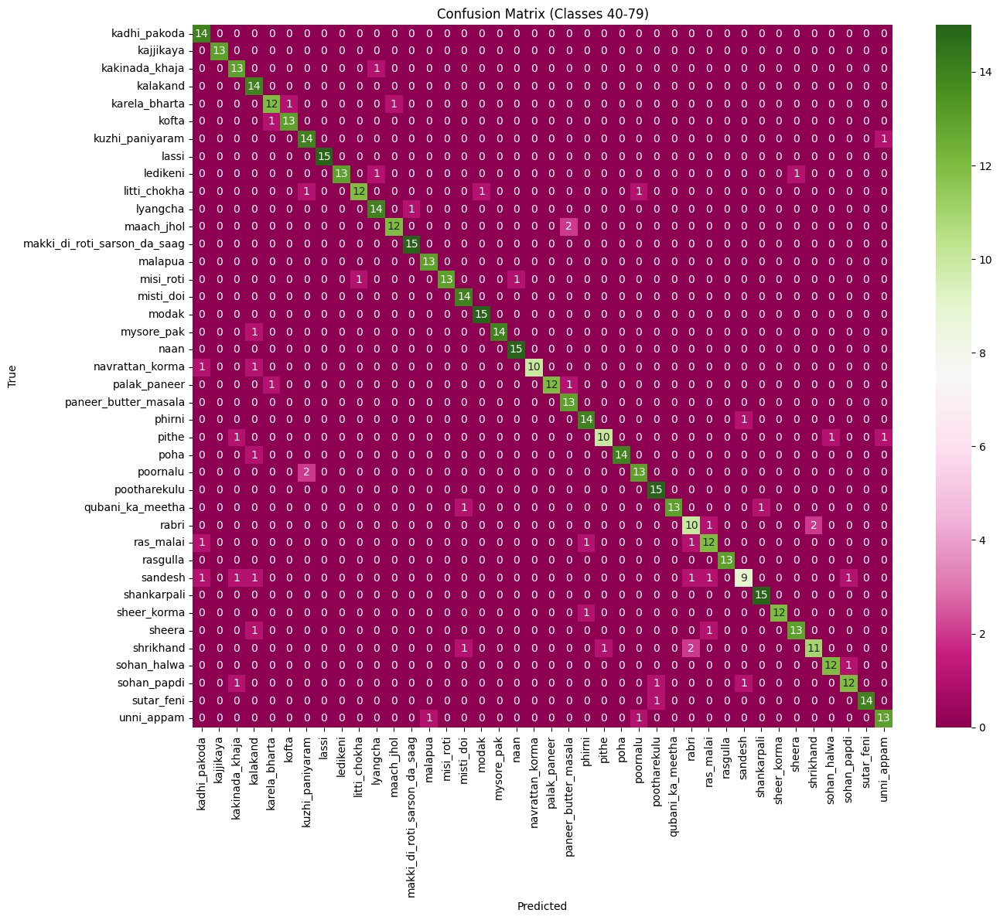

In [57]:
# Full confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Reverse class index
idx_to_class = {v: k for k, v in class_to_idx.items()}
class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

# ---- Part 1: First 40 classes ----
plt.figure(figsize=(14, 12))
sns.heatmap(cm[:40, :40], annot=True, cmap="Spectral", xticklabels=class_names[:40], yticklabels=class_names[:40])
plt.title("Confusion Matrix (Classes 0-39)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# ---- Part 2: Next 40 classes ----
plt.figure(figsize=(14, 12))
sns.heatmap(cm[40:, 40:], annot=True, cmap="PiYG", xticklabels=class_names[40:], yticklabels=class_names[40:])
plt.title("Confusion Matrix (Classes 40-79)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [60]:
import joblib
joblib.dump(rf_model, 'random_forest_classifier.pkl')


['random_forest_classifier.pkl']

# prediction

Predicted Class: unni_appam
Confidence: 0.4800

Top 5 Predictions:
unni_appam: 0.4800
gulab_jamun: 0.0400
kofta: 0.0400
kuzhi_paniyaram: 0.0400
poornalu: 0.0400


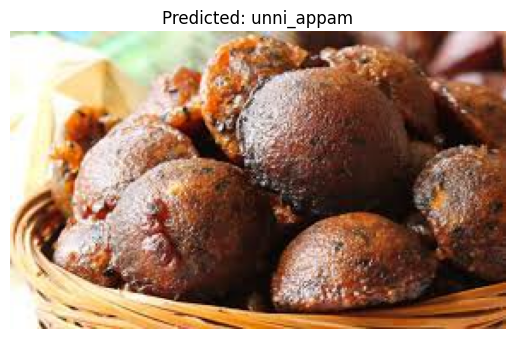

In [ ]:
from PIL import Image
import torch
import torchvision.transforms as transforms
import numpy as np
import joblib

# Load the saved models
model.load_state_dict(torch.load("mobilenet_indian_food.pth", map_location=device))
model.eval()

rf = joblib.load("random_forest_classifier.pkl")  # Random Forest model saved earlier

# Your class index mapping (reverse from class_to_idx)
idx_to_class = {v: k for k, v in class_to_idx.items()}

# Define the same transform used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # MobileNetV2 ImageNet mean
        std=[0.229, 0.224, 0.225]    # MobileNetV2 ImageNet std
    )
])

def extract_features_single_image(image_tensor):
    image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        features = model.features(image_tensor)
        features = torch.nn.functional.adaptive_avg_pool2d(features, 1)
        features = features.view(features.size(0), -1)
    return features.cpu().numpy()

# Load and preprocess the image
def predict_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Ensure RGB
    image_tensor = transform(image)

    # Extract features
    features = extract_features_single_image(image_tensor)

    # Predict with Random Forest
    pred_label = rf.predict(features)[0]
    pred_prob = rf.predict_proba(features)[0]

    # Output
    predicted_class = idx_to_class[pred_label]
    confidence = np.max(pred_prob)

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.4f}")

    # Optionally display top-5 probabilities
    top5_indices = np.argsort(pred_prob)[::-1][:5]
    print("\nTop 5 Predictions:")
    for i in top5_indices:
        print(f"{idx_to_class[i]}: {pred_prob[i]:.4f}")

    # Optional: Show image
    import matplotlib.pyplot as plt
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_class}")
    plt.axis('off')
    plt.show()

# Example usage
predict_image(r"C:\Users\USER\Downloads\Indain food classification\Indian Food Images\Indian Food Images\unni_appam\5d99298b9c.jpg")


Predicted Class: shrikhand
Confidence: 0.6000

Top 5 Predictions:
shrikhand: 0.6000
jalebi: 0.0600
misti_doi: 0.0300
sutar_feni: 0.0300
chapati: 0.0300


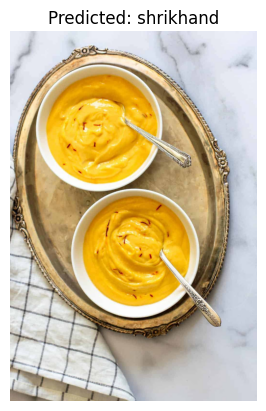

In [63]:
from PIL import Image
import torch
import torchvision.transforms as transforms
import numpy as np
import joblib

# Load the saved models
model.load_state_dict(torch.load("mobilenet_indian_food.pth", map_location=device))
model.eval()

rf = joblib.load("random_forest_classifier.pkl")  # Random Forest model saved earlier

# Your class index mapping (reverse from class_to_idx)
idx_to_class = {v: k for k, v in class_to_idx.items()}

# Define the same transform used during training
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  # MobileNetV2 ImageNet mean
        std=[0.229, 0.224, 0.225]    # MobileNetV2 ImageNet std
    )
])

def extract_features_single_image(image_tensor):
    image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        features = model.features(image_tensor)
        features = torch.nn.functional.adaptive_avg_pool2d(features, 1)
        features = features.view(features.size(0), -1)
    return features.cpu().numpy()

# Load and preprocess the image
def predict_image(image_path):
    image = Image.open(image_path).convert('RGB')  # Ensure RGB
    image_tensor = transform(image)

    # Extract features
    features = extract_features_single_image(image_tensor)

    # Predict with Random Forest
    pred_label = rf.predict(features)[0]
    pred_prob = rf.predict_proba(features)[0]

    # Output
    predicted_class = idx_to_class[pred_label]
    confidence = np.max(pred_prob)

    print(f"Predicted Class: {predicted_class}")
    print(f"Confidence: {confidence:.4f}")

    # Optionally display top-5 probabilities
    top5_indices = np.argsort(pred_prob)[::-1][:5]
    print("\nTop 5 Predictions:")
    for i in top5_indices:
        print(f"{idx_to_class[i]}: {pred_prob[i]:.4f}")

    # Optional: Show image
    import matplotlib.pyplot as plt
    plt.imshow(image)
    plt.title(f"Predicted: {predicted_class}")
    plt.axis('off')
    plt.show()

# Example usage
predict_image(r"C:\Users\USER\Downloads\Indain food classification\Indian Food Images\Indian Food Images\shrikhand\8ff6eab553.jpg")


c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Predicted Class: shrikhand
Confidence: 0.6000

Top 5 Predictions:
shrikhand: 0.6000
jalebi: 0.0600
misti_doi: 0.0300
sutar_feni: 0.0300
chapati: 0.0300


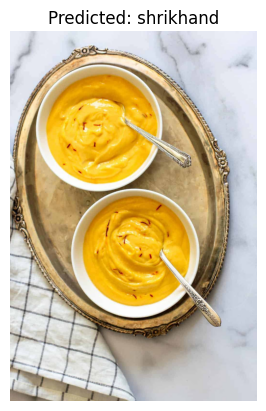

In [72]:
import torch
import torch.nn as nn
from torchvision import models
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import joblib
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load MobileNetV2 model
num_classes = 80  # Adjust based on your dataset
mobilenet = models.mobilenet_v2(pretrained=False)
mobilenet.classifier[1] = nn.Linear(mobilenet.last_channel, num_classes)
mobilenet.load_state_dict(torch.load("mobilenet_indian_food.pth", map_location=device))
mobilenet.eval()
mobilenet.to(device)

# Load Random Forest model
rf = joblib.load("random_forest_classifier.pkl")

class_to_idx = {
    "adhirasam": 0,
    "aloo_gobi": 1,
    "aloo_matar": 2,
    "aloo_methi": 3,
    "aloo_shimla_mirch": 4,
    "aloo_tikki": 5,
    "anarsa": 6,
    "ariselu": 7,
    "bandar_laddu": 8,
    "basundi": 9,
    "bhatura": 10,
    "bhindi_masala": 11,
    "biryani": 12,
    "boondi": 13,
    "butter_chicken": 14,
    "chak_hao_kheer": 15,
    "cham_cham": 16,
    "chana_masala": 17,
    "chapati": 18,
    "chhena_kheeri": 19,
    "chicken_razala": 20,
    "chicken_tikka": 21,
    "chicken_tikka_masala": 22,
    "chikki": 23,
    "daal_baati_churma": 24,
    "daal_puri": 25,
    "dal_makhani": 26,
    "dal_tadka": 27,
    "dharwad_pedha": 28,
    "doodhpak": 29,
    "double_ka_meetha": 30,
    "dum_aloo": 31,
    "gajar_ka_halwa": 32,
    "gavvalu": 33,
    "ghevar": 34,
    "gulab_jamun": 35,
    "imarti": 36,
    "jalebi": 37,
    "kachori": 38,
    "kadai_paneer": 39,
    "kadhi_pakoda": 40,
    "kajjikaya": 41,
    "kakinada_khaja": 42,
    "kalakand": 43,
    "karela_bharta": 44,
    "kofta": 45,
    "kuzhi_paniyaram": 46,
    "lassi": 47,
    "ledikeni": 48,
    "litti_chokha": 49,
    "lyangcha": 50,
    "maach_jhol": 51,
    "makki_di_roti_sarson_da_saag": 52,
    "malapua": 53,
    "misi_roti": 54,
    "misti_doi": 55,
    "modak": 56,
    "mysore_pak": 57,
    "naan": 58,
    "navrattan_korma": 59,
    "palak_paneer": 60,
    "paneer_butter_masala": 61,
    "phirni": 62,
    "pithe": 63,
    "poha": 64,
    "poornalu": 65,
    "pootharekulu": 66,
    "qubani_ka_meetha": 67,
    "rabri": 68,
    "rasgulla": 69,
    "ras_malai": 70,
    "sandesh": 71,
    "shankarpali": 72,
    "sheera": 73,
    "sheer_korma": 74,
    "shrikhand": 75,
    "sohan_halwa": 76,
    "sohan_papdi": 77,
    "sutar_feni": 78,
    "unni_appam": 79
}

# Create idx_to_class by reversing class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

# Define image transformation (same as training)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Feature extraction for a single image
def extract_features_single_image(image_tensor):
    image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        features = mobilenet.features(image_tensor)  # Extract features
        features = torch.nn.functional.adaptive_avg_pool2d(features, 1)  # Global average pooling
        features = features.view(features.size(0), -1)  # Flatten
    return features.cpu().numpy()

# Predict single image
def predict_image(image_path):
    try:
        # Load and preprocess image
        image = Image.open(image_path).convert('RGB')
        image_tensor = transform(image)

        # Extract features
        features = extract_features_single_image(image_tensor)

        # Predict with Random Forest
        pred_label = rf.predict(features)[0]
        pred_prob = rf.predict_proba(features)[0]

        # Get results
        predicted_class = idx_to_class[pred_label]
        confidence = np.max(pred_prob)

        # Print results
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.4f}")

        # Top-5 predictions
        top5_indices = np.argsort(pred_prob)[::-1][:5]
        print("\nTop 5 Predictions:")
        for i in top5_indices:
            print(f"{idx_to_class[i]}: {pred_prob[i]:.4f}")

        # Display image
        plt.imshow(image)
        plt.title(f"Predicted: {predicted_class}")
        plt.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error processing image: {str(e)}")

# Example usage
image_path = r"C:\Users\USER\Downloads\Indain food classification\Indian Food Images\Indian Food Images\shrikhand\8ff6eab553.jpg"
predict_image(image_path)

c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Predicted Class: chapati
Confidence: 0.6500

Top 5 Predictions:
chapati: 0.6500
bhatura: 0.0600
daal_puri: 0.0500
makki_di_roti_sarson_da_saag: 0.0300
misi_roti: 0.0300


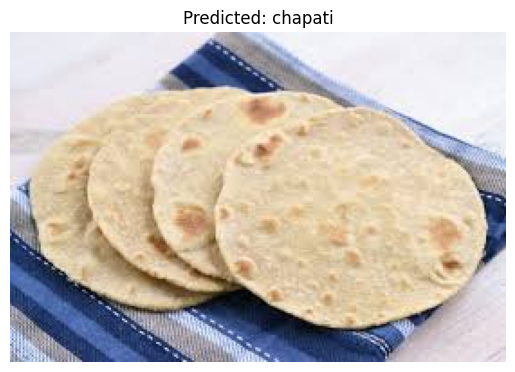

In [73]:
import torch
import torch.nn as nn
from torchvision import models
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import joblib
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load MobileNetV2 model
num_classes = 80  # Adjust based on your dataset
mobilenet = models.mobilenet_v2(pretrained=False)
mobilenet.classifier[1] = nn.Linear(mobilenet.last_channel, num_classes)
mobilenet.load_state_dict(torch.load("mobilenet_indian_food.pth", map_location=device))
mobilenet.eval()
mobilenet.to(device)

# Load Random Forest model
rf = joblib.load("random_forest_classifier.pkl")

class_to_idx = {
    "adhirasam": 0,
    "aloo_gobi": 1,
    "aloo_matar": 2,
    "aloo_methi": 3,
    "aloo_shimla_mirch": 4,
    "aloo_tikki": 5,
    "anarsa": 6,
    "ariselu": 7,
    "bandar_laddu": 8,
    "basundi": 9,
    "bhatura": 10,
    "bhindi_masala": 11,
    "biryani": 12,
    "boondi": 13,
    "butter_chicken": 14,
    "chak_hao_kheer": 15,
    "cham_cham": 16,
    "chana_masala": 17,
    "chapati": 18,
    "chhena_kheeri": 19,
    "chicken_razala": 20,
    "chicken_tikka": 21,
    "chicken_tikka_masala": 22,
    "chikki": 23,
    "daal_baati_churma": 24,
    "daal_puri": 25,
    "dal_makhani": 26,
    "dal_tadka": 27,
    "dharwad_pedha": 28,
    "doodhpak": 29,
    "double_ka_meetha": 30,
    "dum_aloo": 31,
    "gajar_ka_halwa": 32,
    "gavvalu": 33,
    "ghevar": 34,
    "gulab_jamun": 35,
    "imarti": 36,
    "jalebi": 37,
    "kachori": 38,
    "kadai_paneer": 39,
    "kadhi_pakoda": 40,
    "kajjikaya": 41,
    "kakinada_khaja": 42,
    "kalakand": 43,
    "karela_bharta": 44,
    "kofta": 45,
    "kuzhi_paniyaram": 46,
    "lassi": 47,
    "ledikeni": 48,
    "litti_chokha": 49,
    "lyangcha": 50,
    "maach_jhol": 51,
    "makki_di_roti_sarson_da_saag": 52,
    "malapua": 53,
    "misi_roti": 54,
    "misti_doi": 55,
    "modak": 56,
    "mysore_pak": 57,
    "naan": 58,
    "navrattan_korma": 59,
    "palak_paneer": 60,
    "paneer_butter_masala": 61,
    "phirni": 62,
    "pithe": 63,
    "poha": 64,
    "poornalu": 65,
    "pootharekulu": 66,
    "qubani_ka_meetha": 67,
    "rabri": 68,
    "rasgulla": 69,
    "ras_malai": 70,
    "sandesh": 71,
    "shankarpali": 72,
    "sheera": 73,
    "sheer_korma": 74,
    "shrikhand": 75,
    "sohan_halwa": 76,
    "sohan_papdi": 77,
    "sutar_feni": 78,
    "unni_appam": 79
}

# Create idx_to_class by reversing class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

# Define image transformation (same as training)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Feature extraction for a single image
def extract_features_single_image(image_tensor):
    image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        features = mobilenet.features(image_tensor)  # Extract features
        features = torch.nn.functional.adaptive_avg_pool2d(features, 1)  # Global average pooling
        features = features.view(features.size(0), -1)  # Flatten
    return features.cpu().numpy()

# Predict single image
def predict_image(image_path):
    try:
        # Load and preprocess image
        image = Image.open(image_path).convert('RGB')
        image_tensor = transform(image)

        # Extract features
        features = extract_features_single_image(image_tensor)

        # Predict with Random Forest
        pred_label = rf.predict(features)[0]
        pred_prob = rf.predict_proba(features)[0]

        # Get results
        predicted_class = idx_to_class[pred_label]
        confidence = np.max(pred_prob)

        # Print results
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.4f}")

        # Top-5 predictions
        top5_indices = np.argsort(pred_prob)[::-1][:5]
        print("\nTop 5 Predictions:")
        for i in top5_indices:
            print(f"{idx_to_class[i]}: {pred_prob[i]:.4f}")

        # Display image
        plt.imshow(image)
        plt.title(f"Predicted: {predicted_class}")
        plt.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error processing image: {str(e)}")



# Example usage
predict_image(r"C:\Users\USER\Downloads\Indain food classification\Indian Food Images\Indian Food Images\chapati\9f716e6c4c.jpg")


c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\miniconda3\envs\Arjun\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Predicted Class: unni_appam
Confidence: 0.4800

Top 5 Predictions:
unni_appam: 0.4800
gulab_jamun: 0.0400
kofta: 0.0400
kuzhi_paniyaram: 0.0400
poornalu: 0.0400


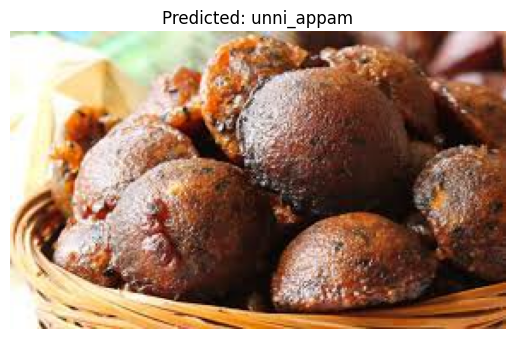

In [74]:
import torch
import torch.nn as nn
from torchvision import models
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import joblib
import matplotlib.pyplot as plt

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load MobileNetV2 model
num_classes = 80  # Adjust based on your dataset
mobilenet = models.mobilenet_v2(pretrained=False)
mobilenet.classifier[1] = nn.Linear(mobilenet.last_channel, num_classes)
mobilenet.load_state_dict(torch.load("mobilenet_indian_food.pth", map_location=device))
mobilenet.eval()
mobilenet.to(device)

# Load Random Forest model
rf = joblib.load("random_forest_classifier.pkl")

class_to_idx = {
    "adhirasam": 0,
    "aloo_gobi": 1,
    "aloo_matar": 2,
    "aloo_methi": 3,
    "aloo_shimla_mirch": 4,
    "aloo_tikki": 5,
    "anarsa": 6,
    "ariselu": 7,
    "bandar_laddu": 8,
    "basundi": 9,
    "bhatura": 10,
    "bhindi_masala": 11,
    "biryani": 12,
    "boondi": 13,
    "butter_chicken": 14,
    "chak_hao_kheer": 15,
    "cham_cham": 16,
    "chana_masala": 17,
    "chapati": 18,
    "chhena_kheeri": 19,
    "chicken_razala": 20,
    "chicken_tikka": 21,
    "chicken_tikka_masala": 22,
    "chikki": 23,
    "daal_baati_churma": 24,
    "daal_puri": 25,
    "dal_makhani": 26,
    "dal_tadka": 27,
    "dharwad_pedha": 28,
    "doodhpak": 29,
    "double_ka_meetha": 30,
    "dum_aloo": 31,
    "gajar_ka_halwa": 32,
    "gavvalu": 33,
    "ghevar": 34,
    "gulab_jamun": 35,
    "imarti": 36,
    "jalebi": 37,
    "kachori": 38,
    "kadai_paneer": 39,
    "kadhi_pakoda": 40,
    "kajjikaya": 41,
    "kakinada_khaja": 42,
    "kalakand": 43,
    "karela_bharta": 44,
    "kofta": 45,
    "kuzhi_paniyaram": 46,
    "lassi": 47,
    "ledikeni": 48,
    "litti_chokha": 49,
    "lyangcha": 50,
    "maach_jhol": 51,
    "makki_di_roti_sarson_da_saag": 52,
    "malapua": 53,
    "misi_roti": 54,
    "misti_doi": 55,
    "modak": 56,
    "mysore_pak": 57,
    "naan": 58,
    "navrattan_korma": 59,
    "palak_paneer": 60,
    "paneer_butter_masala": 61,
    "phirni": 62,
    "pithe": 63,
    "poha": 64,
    "poornalu": 65,
    "pootharekulu": 66,
    "qubani_ka_meetha": 67,
    "rabri": 68,
    "rasgulla": 69,
    "ras_malai": 70,
    "sandesh": 71,
    "shankarpali": 72,
    "sheera": 73,
    "sheer_korma": 74,
    "shrikhand": 75,
    "sohan_halwa": 76,
    "sohan_papdi": 77,
    "sutar_feni": 78,
    "unni_appam": 79
}

# Create idx_to_class by reversing class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

# Define image transformation (same as training)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Feature extraction for a single image
def extract_features_single_image(image_tensor):
    image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension
    with torch.no_grad():
        features = mobilenet.features(image_tensor)  # Extract features
        features = torch.nn.functional.adaptive_avg_pool2d(features, 1)  # Global average pooling
        features = features.view(features.size(0), -1)  # Flatten
    return features.cpu().numpy()

# Predict single image
def predict_image(image_path):
    try:
        # Load and preprocess image
        image = Image.open(image_path).convert('RGB')
        image_tensor = transform(image)

        # Extract features
        features = extract_features_single_image(image_tensor)

        # Predict with Random Forest
        pred_label = rf.predict(features)[0]
        pred_prob = rf.predict_proba(features)[0]

        # Get results
        predicted_class = idx_to_class[pred_label]
        confidence = np.max(pred_prob)

        # Print results
        print(f"Predicted Class: {predicted_class}")
        print(f"Confidence: {confidence:.4f}")

        # Top-5 predictions
        top5_indices = np.argsort(pred_prob)[::-1][:5]
        print("\nTop 5 Predictions:")
        for i in top5_indices:
            print(f"{idx_to_class[i]}: {pred_prob[i]:.4f}")

        # Display image
        plt.imshow(image)
        plt.title(f"Predicted: {predicted_class}")
        plt.axis('off')
        plt.show()

    except Exception as e:
        print(f"Error processing image: {str(e)}")




# Example usage
predict_image(r"C:\Users\USER\Downloads\Indain food classification\Indian Food Images\Indian Food Images\unni_appam\5d99298b9c.jpg")
